In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly_express as px
from google.cloud import bigquery
from google.oauth2 import service_account
from prophet import Prophet
from statsforecast import StatsForecast
from statsforecast.models import Naive, SeasonalNaive, SeasonalWindowAverage, AutoARIMA

# Importando os dados

In [3]:
projeto_id = 'pos-tech-403001'
dataset_id = 'tech_challenge'
tabela_id = 'raw_petr_brent'

In [4]:
# Autenticação para o BigQuery usando arquivo de credenciais
credentials = service_account.Credentials.from_service_account_file('/home/chave.json')
client = bigquery.Client(credentials=credentials, project=projeto_id)

In [5]:
# Consulta SQL para selecionar todos os dados da tabela
consulta_sql = f'SELECT * FROM `{projeto_id}.{dataset_id}.{tabela_id}`'

# Executa a consulta
resultado = client.query(consulta_sql)

# Converte o resultado em um DataFrame do Pandas
df = resultado.to_dataframe()

# Tratando os dados

In [6]:
# transformando a coluna com as datas para Datetime, e ordernando essa coluna
df['Data'] = pd.to_datetime(df['Data'], format='%d/%m/%Y')
df = df.sort_values(by='Data', ascending=True)
df.reset_index(inplace=True, drop=True)

# Análise Exploratória

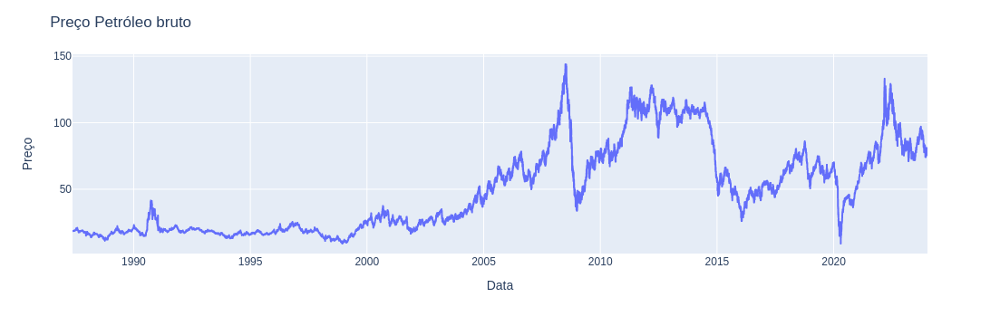

In [7]:
fig = px.line(df, x = 'Data', y='preco_petroleo_bruto')
fig.update_layout(title='Preço Petróleo bruto',
                   xaxis_title='Data',
                   yaxis_title='Preço')
fig.show()

# Prophet

In [8]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [9]:
df_prophet = df[['Data', 'preco_petroleo_bruto']]
df_prophet.columns = ['ds','y']
df_prophet.tail()

,ds,y
11077,2024-01-02,76.24
11078,2024-01-03,77.18
11079,2024-01-04,75.79
11080,2024-01-05,78.31
11081,2024-01-08,75.47


In [10]:
def train_test_split_data(dff, start_train, end_train):
    train =  dff.loc[(dff['ds'] >= start_train) & (dff['ds'] <= end_train)]
    test = dff.loc[(dff['ds'] > end_train)]
    future = len(test)
    return train, test, future

In [86]:
def mape(y_true,y_pred):
    y_true = y_true.values
    y_pred = y_pred.values
    r = np.mean(np.abs((y_true - y_pred) / y_true))
    return round(r*100, 2)

In [136]:
train, test, _  = train_test_split_data(df_prophet,'1980-06-01','2023-11-23')

model = Prophet(interval_width=0.95)

model.fit(train)

fut = model.make_future_dataframe(periods=len(test), include_history=True, freq='D')

forecast = model.predict(fut)

print(f'Tamanho da base de treino:{train.shape}')
print(f'Tamanho da base de teste:{test.shape}')

plot_plotly(model, forecast)

20:58:50 - cmdstanpy - INFO - Chain [1] start processing
20:58:54 - cmdstanpy - INFO - Chain [1] done processing


Tamanho da base de treino:(11052, 2)
Tamanho da base de teste:(30, 2)


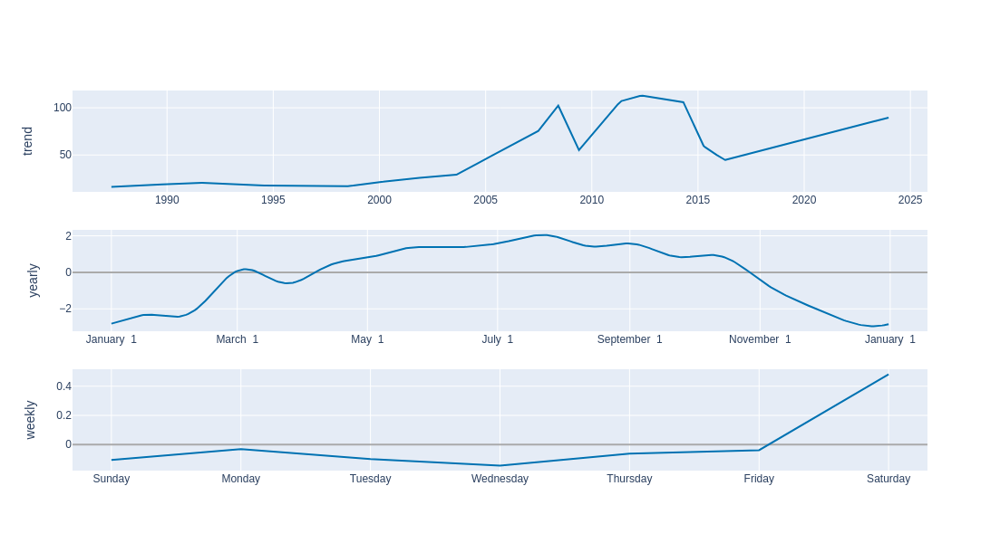

In [135]:
plot_components_plotly(model, forecast)